

---

## Topic 1: Why We Need Optimization Techniques – The Problems with Training Neural Networks

### 1. Introduction

When you train a neural network, you are trying to find the best set of **weights** (internal parameters) so that the network’s predictions are as close as possible to the true values. This is done by minimizing a **loss function**, which measures how wrong the network’s predictions are.

However, the **loss function** of a real neural network is not simple. It is a complex, wavy surface with hills, valleys, and flat areas. Optimization techniques are methods to navigate this surface efficiently to find the lowest point (the minimum loss). Without good optimization, training can be too slow, get stuck in bad spots, or never find a good solution.

### 2. Detailed Explanation

The transcript explains three main problems that occur when training deep neural networks, especially if you use a basic method called **vanilla gradient descent**.

#### First, understand the Loss Function Graph
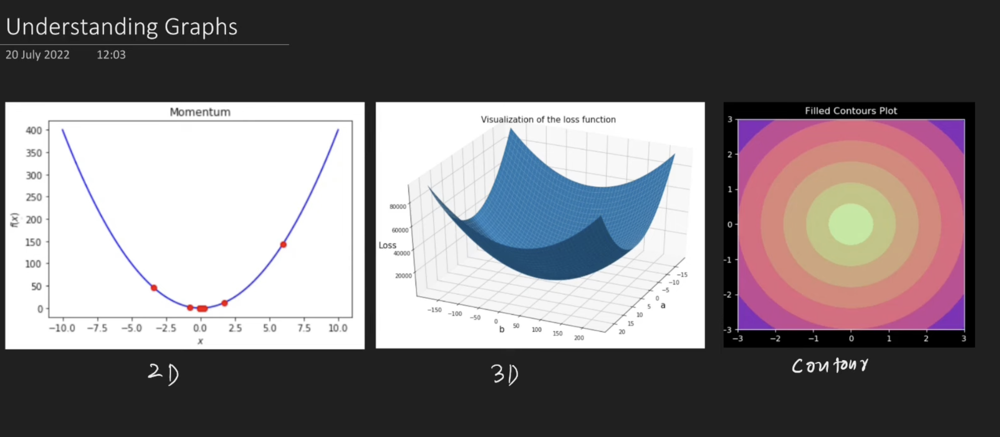
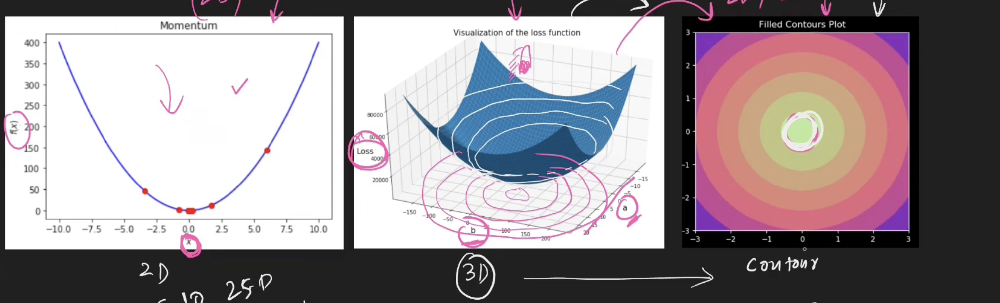
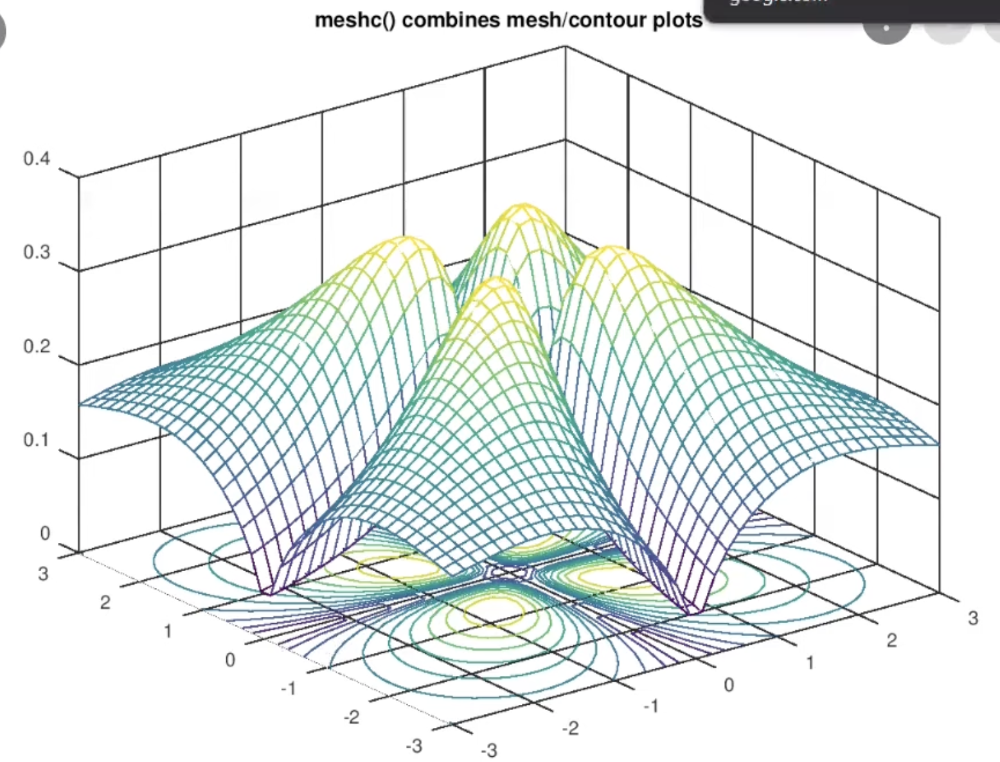
Imagine you have a neural network with only **one weight parameter (W)**. If you plot the loss against different values of W, you get a **2D curve** (like a U-shape or a wavy line).  
If the network has **two parameters (W and b)**, you get a **3D surface** (like a mountain range).  
If there are more parameters (which is typical), we cannot visualize it, but the same ideas apply.(seen from top view,we see cicles these are contour graphs)

> **Key terms:**
> - **Loss Function:** A mathematical function that calculates the error between the network's prediction and the actual correct answer.
> - **Parameters (Weights):** The numbers inside the neural network that get adjusted during training.
> - **Gradient:** The slope of the loss function at a given point. It tells you which direction to move to reduce loss.

#### The Three Main Problems in Non-Convex Optimization

A **convex** function is like a smooth bowl – it has one clear lowest point. A **non-convex** function is like a wrinkled landscape – it has many hills and valleys. Real neural networks are **non-convex**, causing these problems:
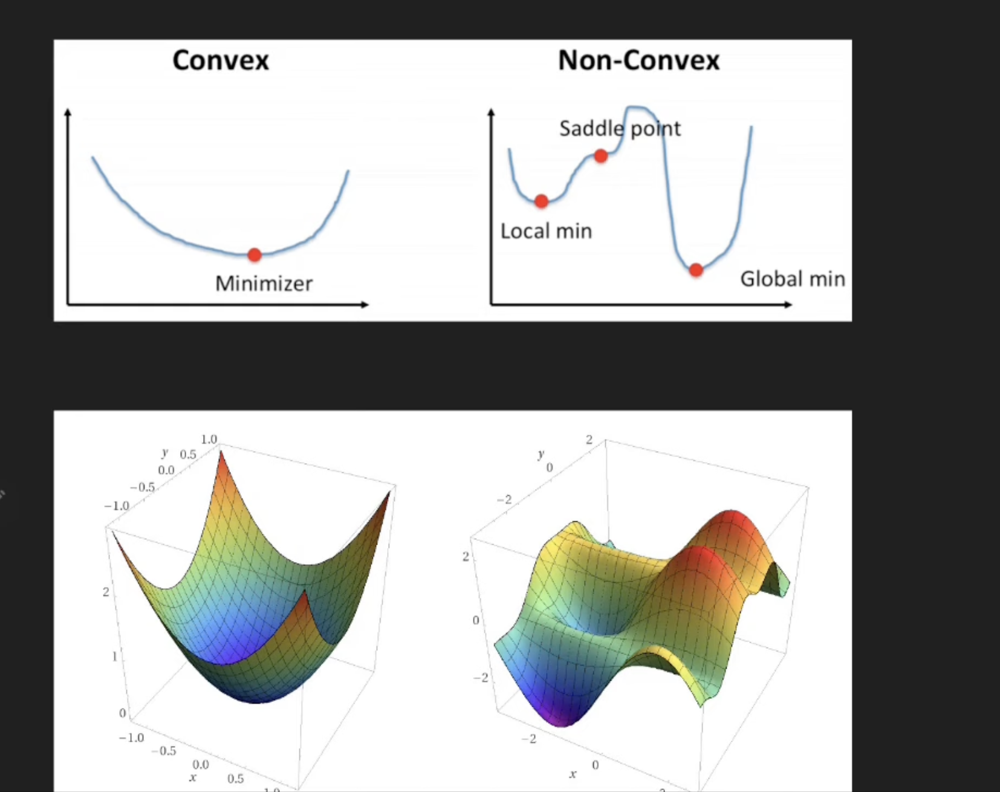
| Problem | What it means | Why it hurts training |
| :--- | :--- | :--- |
| **1. Local Minimum** | A low point in the loss surface that is *not* the absolute lowest point (global minimum). | The optimization gets stuck in this "false" valley, thinking it has found the best solution, when a better solution exists elsewhere. |
| **2. Saddle Point** | A point where the surface is flat. One direction goes up, another goes down. | The gradient is very small or zero, so the optimizer moves very slowly, making training take a very long time. |
| **3. High Curvature** | The loss surface curves very sharply (steep cliffs or tight ravines). | The optimizer struggles to navigate sharp turns. It may bounce around or move inefficiently. |

> **Analogy:** Imagine you are blindfolded and trying to find the lowest point in a large, bumpy field.
> - **Local minimum** – You step into a small hole and stop, but the lowest point of the whole field is elsewhere.
> - **Saddle point** – You step onto a long, flat ridge. You are not going up or down, so you move very slowly, unsure which way to go.
> - **High curvature** – You suddenly encounter a steep, narrow gully. You keep over-correcting and zig-zag instead of smoothly going down.

#### How Basic (Vanilla) Gradient Descent Fails

The transcript shows visualizations:
- **On a simple convex problem** (smooth bowl), basic gradient descent works fine – it goes smoothly to the minimum.
- **On a non-convex problem**, basic gradient descent suffers:
    - Training becomes very slow (especially at saddle points).
    - It finds suboptimal (not very good) solutions.
    - It gets stuck in local minima.

### 3. Key Points

- Neural network training = minimizing a **loss function** by adjusting weights.
- Real loss functions are **non-convex** (complex, wavy surfaces).
- Three major problems in non-convex optimization:
    1.  **Local minimum** – getting stuck in a false valley.
    2.  **Saddle point** – flat area that slows down training drastically.
    3.  **High curvature** – sharp curves that make navigation inefficient.
    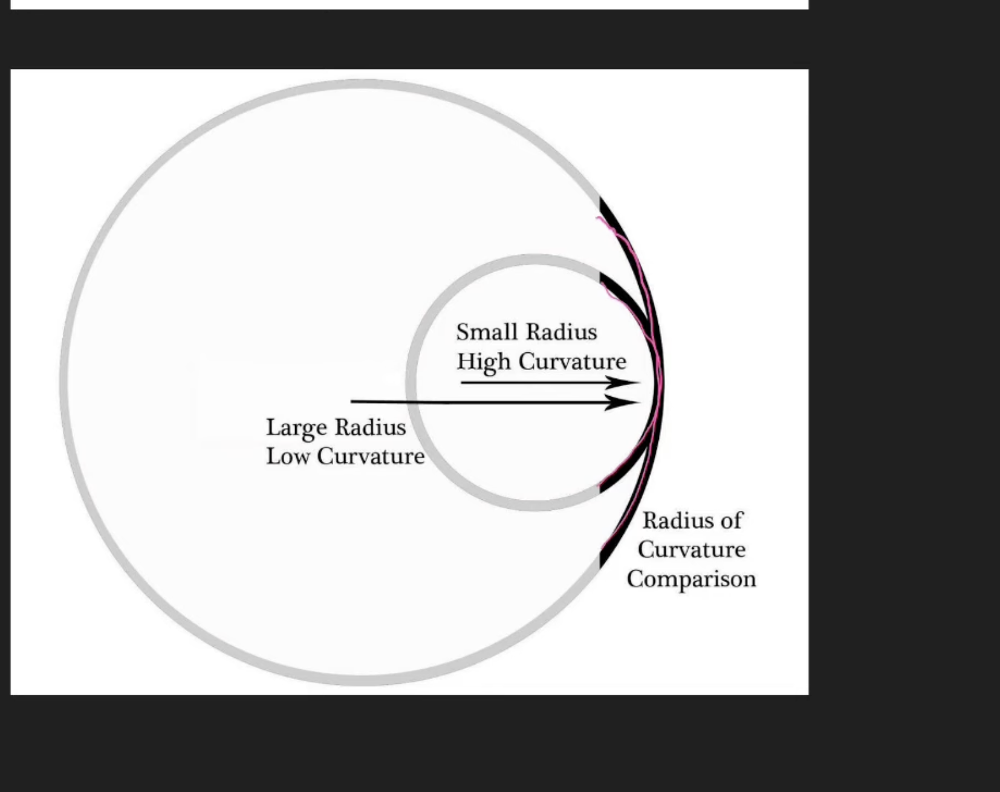
- Basic gradient descent handles simple (convex) problems well but fails on real-world deep learning tasks.
- Better optimization techniques (like Momentum, which will be explained in the next topic) are needed to solve these problems.

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Thinking the loss function is simple and U-shaped. | Real neural networks have very complex, non-convex loss surfaces. | Always remember that deep learning optimization is difficult; you need advanced optimizers. |
| Believing that if the loss stops decreasing, you have found the best solution. | You might be stuck in a **local minimum** or at a **saddle point**. | Try techniques like Momentum or restart training from different initial points. |
| Ignoring the problem of slow training at saddle points. | You might waste hours waiting for the optimizer to cross a flat region. | Use optimizers specifically designed to accelerate through flat areas (like Momentum). |

### 5. Interview / Exam Questions

**Q1: What is a non-convex optimization problem in the context of deep learning?**  
**A:** It means the loss function has multiple local minima, saddle points, and regions of high curvature, rather than a single smooth bowl shape. This makes finding the global minimum (best weights) challenging.

**Q2: Name the three main problems that occur when using vanilla gradient descent on non-convex loss functions.**  
**A:** (1) Local minima, (2) Saddle points, (3) High curvature.

**Q3: Why is a saddle point problematic for training?**  
**A:** At a saddle point, the gradient is very small or zero in some directions. The optimizer moves extremely slowly, causing very long training times.

**Q4: What is the difference between a local minimum and the global minimum?**  
**A:** The global minimum is the absolute lowest point of the entire loss function (best possible solution). A local minimum is a low point only within a small surrounding area, but not the lowest overall (a suboptimal solution).

### 6. Revision Notes

- **Goal of training:** Minimize loss function by adjusting weights.
- **Real loss functions:** Non-convex (complex, wavy, hilly).
- **Basic gradient descent (vanilla SGD)** works on convex (bowl-shaped) problems.
- **On non-convex problems, vanilla SGD suffers from:**
    - **Local minimum** (gets stuck in wrong valley)
    - **Saddle point** (flat area → very slow)
    - **High curvature** (sharp turns → inefficient)
- **Result:** Poor solutions or extremely slow training.
- **Solution:** Advanced optimization techniques (e.g., Momentum).

---


## Topic 2: What is Momentum Optimization and Why Use It

### 1. Introduction

**Momentum** is an optimization technique designed to solve exactly the three problems we just learned about (local minima, saddle points, and high curvature). It makes neural network training **faster** and more **effective** by adding a "memory" of past updates. Instead of only looking at the current gradient (slope), Momentum remembers which directions have been taken before and builds speed in consistent directions.

**Real-life use:** Almost all modern deep learning frameworks (PyTorch, TensorFlow) include Momentum as a standard optimizer (often called "SGD with Momentum"). It's widely used in image recognition, natural language processing, and reinforcement learning.

### 2. Detailed Explanation

#### The Core Intuition – Two Analogies

**Analogy 1: Asking for directions (The Confidence Analogy)**

Imagine you are driving to a destination but don't know the way. You stop and ask 4 different people for directions. If all 4 point in the same direction, you gain **confidence** and speed up in that direction. If 2 point one way and 2 point another way, you still move forward but with **lower speed** because you're less certain.

> **How this applies to Momentum:** Your past gradients (previous "directions") accumulate. If the last several updates all pointed in roughly the same direction, Momentum increases your speed in that direction. If they contradict each other, speed decreases.

**Analogy 2: Rolling a ball down a hill (The Physics Analogy)**

A small ball rolling down a hill:
- It gains **velocity** as it rolls downhill.
- It has **momentum** (mass × velocity).
- If it encounters a small bump or a shallow hole, its momentum carries it **over** the obstacle and out of the local minimum.
- If the hill gets flat, it doesn't stop immediately – it continues rolling due to its existing velocity.

> **How this applies to Momentum:** The optimizer acts like a ball with mass. It builds up "velocity" from past gradients. This velocity helps it:
> - **Cross flat regions** (saddle points) quickly instead of slowing down.
> - **Roll out of small local minima** to find better solutions.
> - **Smooth out oscillations** caused by high curvature.

#### What Problems Does Momentum Solve?

The transcript explicitly states that Momentum can navigate all three non-convex optimization problems:

| Problem | How Momentum Solves It |
| :--- | :--- |
| **Slow training (saddle points)** | Momentum maintains velocity from past updates, so even when the current gradient is near zero (flat area), the optimizer keeps moving forward. |
| **Local minima** | The accumulated momentum can carry the optimizer "out" of small, false valleys and toward the global minimum. |
| **High curvature** | Momentum averages out oscillations in steep, narrow ravines, allowing smoother and faster progression down the correct path. |

#### Visual Evidence from the Transcript

The transcript describes two key visualizations:
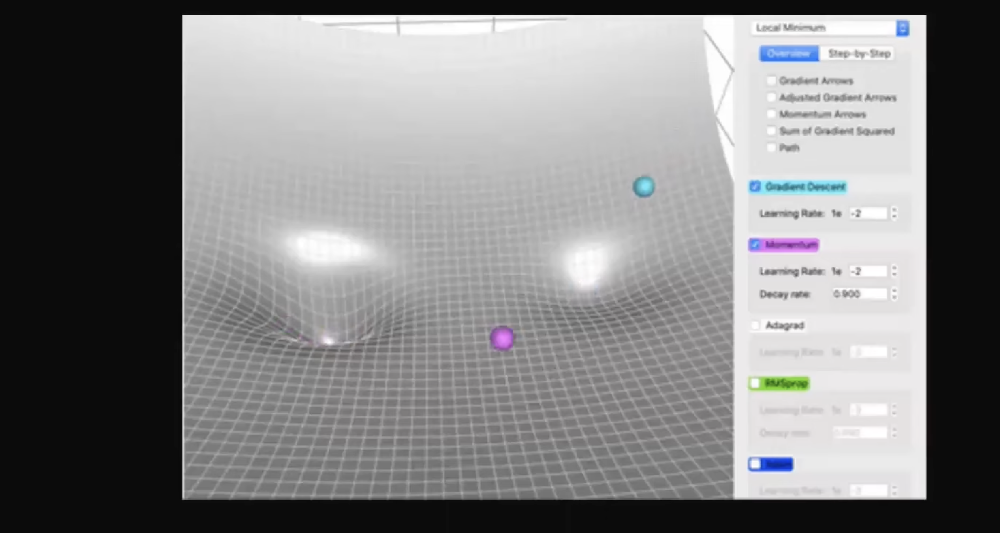
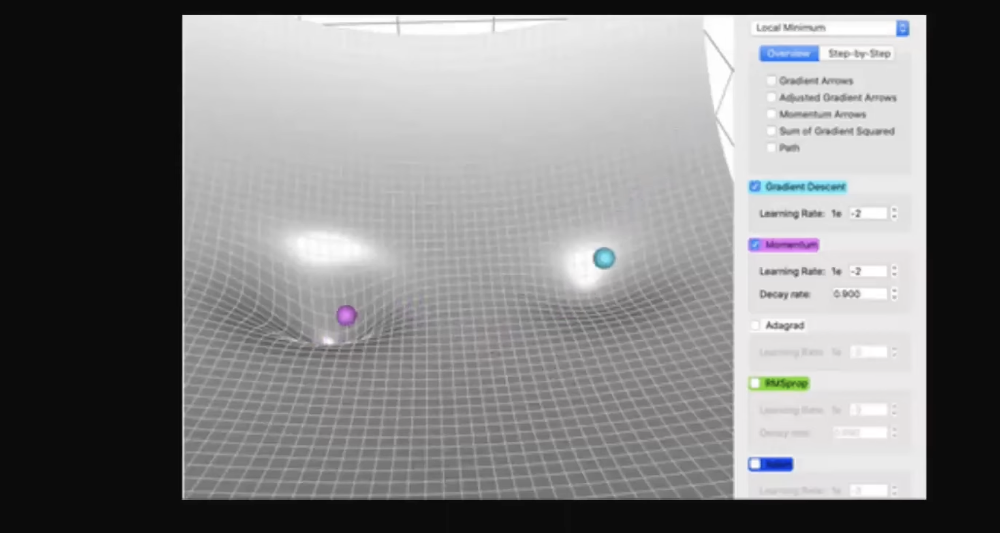
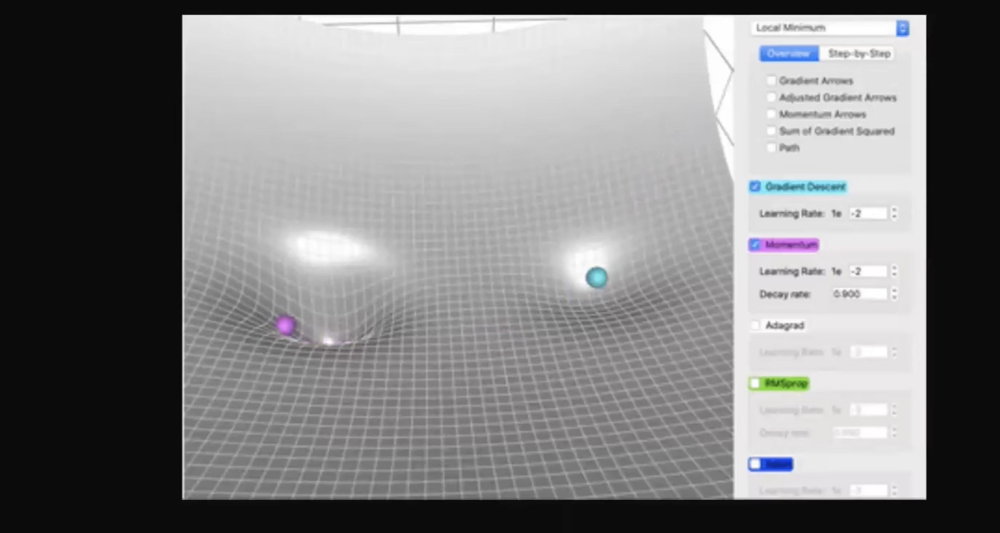
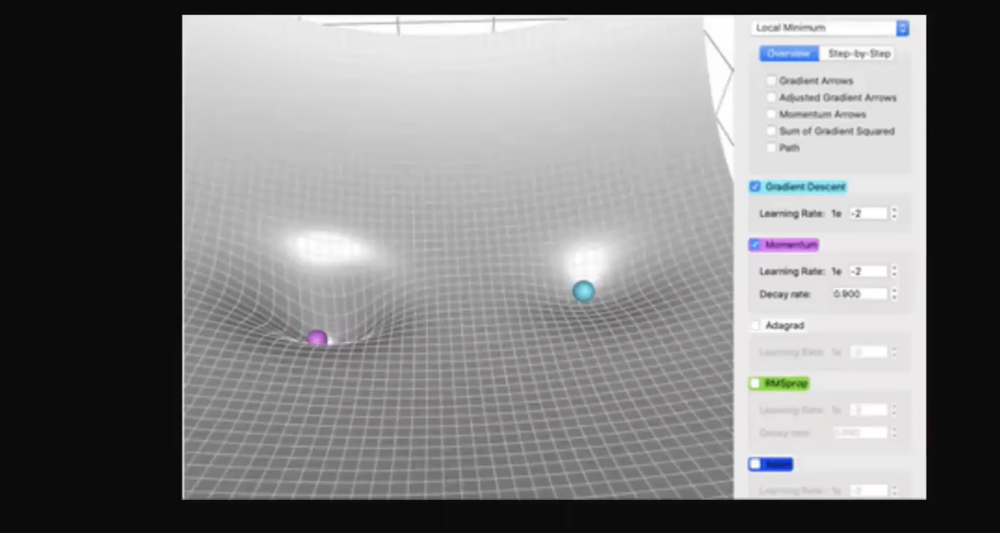

1. **Speed comparison:** When comparing vanilla gradient descent (blue) vs. Momentum (purple) starting from the same point on a loss surface, the purple (Momentum) reaches the minimum much **faster**. It moves down the slope with higher speed.

2. **Local minimum escape:** On a surface with two pits (a small local minimum and a larger global minimum):
   - **Vanilla gradient descent** (blue) gets stuck in the small pit and never escapes.
   - **Momentum** (purple) rolls into the small pit but has enough speed to roll out and continue down into the larger global minimum.

### 3. Key Points

- **Momentum** adds "memory" of past gradient directions to the optimization process.
- It is inspired by physics: an object in motion stays in motion (mass × velocity).
- **Main benefit #1:** Speed – training converges much faster than vanilla gradient descent.
- **Main benefit #2:** Ability to escape small local minima.
- **Main benefit #3:** Smooth traversal of flat regions (saddle points) and high-curvature areas.
- Momentum is **not** a completely different algorithm; it's an improvement on top of standard gradient descent.
- It solves the three main problems of non-convex optimization: local minima, saddle points, and high curvature.

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Thinking Momentum always reaches the global minimum. | Momentum can sometimes overshoot the optimum or get stuck in large local minima. It's better than vanilla SGD but not perfect. | Monitor validation loss; try different initializations or other optimizers if stuck. |
| Believing Momentum is only about speed. | Speed is a major benefit, but escaping local minima and handling saddle points are equally important. | Remember all three advantages when choosing an optimizer. |
| Confusing "momentum" as a completely separate algorithm. | Momentum is "SGD with Momentum" – it builds on standard gradient descent by adding the velocity term. | Understand that Momentum = vanilla SGD + a moving average of past gradients. |

### 5. Interview / Exam Questions

**Q1: What is the main intuition behind Momentum optimization?**  
**A:** If past gradients consistently point in the same direction, the optimizer should gain speed in that direction (like a rolling ball gaining momentum). This helps overcome obstacles like flat regions and small local minima.

**Q2: List three specific problems in non-convex optimization that Momentum solves better than vanilla gradient descent.**  
**A:** (1) Slow training at saddle points, (2) Getting stuck in local minima, (3) Inefficient navigation of high-curvature areas.

**Q3: Why does Momentum help at a saddle point?**  
**A:** At a saddle point, the current gradient is near zero, so vanilla gradient descent barely moves. However, Momentum maintains a velocity from past updates, carrying the optimizer through the flat region without stopping.

**Q4: How does the "rolling ball" analogy explain Momentum's ability to escape local minima?**  
**A:** A ball rolling downhill has kinetic energy (momentum). When it encounters a small uphill section or a shallow pit, its momentum carries it over the obstacle and out of the local minimum. Without momentum, it would stop in the pit.

**Q5: According to the transcript, what is the "single most important benefit" of using Momentum optimization?**  
**A:** Speed – Momentum is faster than normal stochastic gradient descent in 99% of cases.

### 6. Revision Notes

- **Momentum** = an optimization technique that adds "memory" of past gradients.
- **Main idea:** If recent updates point the same way → increase speed in that direction. If they disagree → slow down.
- **Physics analogy:** Rolling ball with mass and velocity.
- **Three problems solved:**
  - ✅ Saddle points (flat regions) → maintains speed
  - ✅ Local minima (false valleys) → rolls out of them
  - ✅ High curvature (oscillations) → smooths the path
- **Primary benefit:** Speed (faster convergence than vanilla SGD)
- **Secondary benefit:** Better final solutions (less likely to get stuck in local minima)

---



## Topic 3: The Mathematics of Momentum – Formula and the Beta Parameter

### 1. Introduction

Now that we understand *why* Momentum works, let's look at *how* it is mathematically implemented. The core idea is simple: instead of updating weights using only the current gradient, Momentum introduces a **velocity term** (often denoted as \( v \)) that accumulates past gradients. This velocity is then used to update the weights.

The transcript also introduces a key hyperparameter called **beta (β)** , which controls how much "memory" the optimizer has – how much it relies on past gradients versus the current gradient.

### 2. Detailed Explanation

#### First, Recall: Vanilla Gradient Descent Formula

In normal (vanilla) gradient descent, the weight update formula is:

\[
W_{new} = W_{current} - \eta \times \nabla L(W_{current})
\]

Where:
- \( W \) = weights (parameters)
- \( \eta \) (eta) = learning rate (how big of a step to take)
- \( \nabla L(W) \) = gradient of the loss function with respect to the weights (the slope/direction)

This formula has **no memory** – each update depends only on the current gradient.

#### The Momentum Update Formula

Momentum introduces a **velocity** variable, \( v \). The update happens in two steps:

**Step 1: Update the velocity**
\[
v_t = \beta \times v_{t-1} + \eta \times \nabla L(W_{current})
\]

**Step 2: Update the weights using the velocity**
\[
W_{new} = W_{current} - v_t
\]

Where:
- \( v_t \) = current velocity (at time step \( t \))
- \( v_{t-1} \) = velocity from the previous update (the "memory")
- \( \beta \) (beta) = a hyperparameter between 0 and 1 that controls decay of past velocities
- \( \eta \) = learning rate
- \( \nabla L(W) \) = current gradient

> **Important note from the transcript:** In the velocity formula, the term \( \beta \times v_{t-1} \) is multiplied by the **current velocity history**, and then you add \( \eta \times \text{current gradient} \). The final velocity \( v_t \) then replaces the simple gradient term in the weight update.

#### Understanding Velocity as Exponential Moving Average

The transcript connects this to a concept called **exponential moving average** (discussed in a previous video). The velocity \( v_t \) is essentially a weighted average of:
- All past gradients (scaled down by \( \beta \) each time)
- The current gradient

This means:
- **Recent gradients** have more influence on the current velocity
- **Older gradients** have progressively less influence (they get multiplied by \( \beta \) repeatedly)

#### The Role of Beta (β)

The beta parameter is critical. Here's what different values of \( \beta \) do:

| Beta (β) Value | Effect | What it means for training |
| :--- | :--- | :--- |
| **β = 0** | Velocity = only current gradient (\( v_t = 0 \times v_{t-1} + \eta \times \nabla L \)) | Momentum is **disabled**; behaves exactly like vanilla gradient descent |
| **β = 0.5** | Moderate memory; past velocities contribute but decay quickly | Less momentum effect; faster to respond to gradient changes |
| **β = 0.9** | Strong memory; past velocities have significant influence | **Common default value** – good balance of speed and stability |
| **β = 0.99** | Very strong memory; past velocities dominate | High momentum; can overshoot optimum significantly |
| **β = 1.0** | Perfect memory; velocities never decay | Dangerous – optimizer may never stop, just oscillates indefinitely |

> **Why not β = 1?** The transcript warns: if β = 1, the algorithm becomes a "ball that will keep roaming" and may never settle at the minimum. It creates a "scientific dynamic equilibrium" but doesn't converge well.

#### How Many Past Gradients Are Considered?

The transcript gives a useful rule of thumb: The effective "window" of past gradients that influence the current velocity is approximately:

\[
\text{Effective window size} \approx \frac{1}{1 - \beta}
\]

Examples:
- If \( \beta = 0.9 \): window size ≈ \( 1 / (1 - 0.9) = 1 / 0.1 = 10 \) past gradients
- If \( \beta = 0.99 \): window size ≈ \( 1 / (1 - 0.99) = 1 / 0.01 = 100 \) past gradients

This means β tells you **how many previous updates** meaningfully contribute to the current momentum.

### 3. Key Points

- **Velocity (v)** is the core addition – it accumulates past gradients.
- **Two-step update:**
  1. \( v_t = \beta \times v_{t-1} + \eta \times \nabla L \)
  2. \( W_{new} = W_{current} - v_t \)
- **Beta (β)** controls momentum strength (typically 0.9 or 0.99).
- **β = 0** = vanilla gradient descent (no momentum).
- **β too high (near 1)** = overshooting, may never converge smoothly.
- **β too low** = not enough momentum benefit.
- The velocity is an **exponential moving average** of past gradients.
- Recent gradients matter more than older gradients.

### 4. Syntax/Structure (Formula Breakdown)

**Vanilla Gradient Descent:**
```
W_new = W_current - learning_rate * current_gradient
```
Line by line:
- `W_new` : updated weights after this step
- `W_current` : current weights before update
- `learning_rate` : step size (η)
- `current_gradient` : slope of loss function at `W_current`

**SGD with Momentum:**
```
# Initialize velocity = 0 at start
velocity = beta * velocity + learning_rate * current_gradient
W_new = W_current - velocity
```
Line by line:
- Line 1: Update velocity by mixing old velocity (beta × previous velocity) with current gradient
- Line 2: Update weights by subtracting the full velocity (not just the gradient)

### 5. Code Examples (from transcript context, explained)

**Python-style pseudocode for Momentum:**
```python
# Initialize
velocity = 0
beta = 0.9
learning_rate = 0.01

# Training loop
for each training step:
    # Compute current gradient (slope of loss)
    current_gradient = compute_gradient(weights)
    
    # Update velocity (momentum step)
    velocity = beta * velocity + learning_rate * current_gradient
    
    # Update weights using velocity
    weights = weights - velocity
```

**Explanation line by line:**
- `velocity = 0` : start with no momentum
- `beta = 0.9` : typical value – 90% memory of past, 10% new gradient
- In the loop:
  - First, calculate how wrong the network is (gradient)
  - Then, update velocity: keep 90% of old velocity, add 10% of current gradient (scaled by learning rate)
  - Finally, move weights by the full velocity amount

**What happens to the old velocity `v_{t-1}`?**
To calculate `v_t`, you need `v_{t-1}`. To get `v_{t-1}`, you need `v_{t-2}`, and so on. This chain means each update contains information from **all previous gradients**, weighted by powers of β.

### 6. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Setting β = 0 and expecting momentum benefits | β = 0 completely disables momentum – it's just vanilla SGD. | Always use β > 0 (typically 0.9). |
| Setting β = 1.0 thinking "more memory is better" | β = 1 means velocities never decay; the optimizer may never stop oscillating or converge. | Never set β exactly 1.0. Use 0.99 at most. |
| Forgetting to initialize velocity to 0 | Velocity is not defined at first step, causing errors. | Always set `v = 0` before training begins. |
| Confusing the role of β vs. learning rate (η) | Both affect step size, but β controls momentum memory, η controls magnitude of new gradient contribution. | Remember: β = "how much past matters," η = "how big are current steps." |
| Thinking the effective window size is exact | The formula 1/(1-β) is an approximation, not exact. | Use it as a guideline, not a precise calculation. |

### 7. Interview / Exam Questions

**Q1: Write the two update equations for SGD with Momentum.**  
**A:** 
1. \( v_t = \beta v_{t-1} + \eta \nabla L(W_t) \)
2. \( W_{t+1} = W_t - v_t \)

**Q2: What happens when β = 0 in the Momentum formula?**  
**A:** The velocity becomes \( v_t = 0 \times v_{t-1} + \eta \nabla L = \eta \nabla L \). Then the weight update becomes \( W_{new} = W_{current} - \eta \nabla L \), which is exactly vanilla gradient descent. Momentum is completely disabled.

**Q3: Why can't we set β = 1.0?**  
**A:** With β = 1, past velocities never decay. The optimizer accumulates all gradients forever and may never stop moving, causing oscillations and failure to settle at the minimum.

**Q4: What does the term \( \beta \times v_{t-1} \) represent conceptually?**  
**A:** It represents the "memory" or "momentum" from all previous updates, exponentially decayed so that older gradients have less influence than recent ones.

**Q5: If β = 0.9, approximately how many past gradients contribute significantly to the current velocity?**  
**A:** Approximately \( 1 / (1 - 0.9) = 1 / 0.1 = 10 \) past gradients.

**Q6: What is the difference between how vanilla SGD and Momentum use the current gradient?**  
**A:** Vanilla SGD uses the current gradient directly to update weights. Momentum combines the current gradient with past velocities to form a new velocity, then uses that velocity to update weights.

### 8. Revision Notes

## Momentum

- **Momentum formula (two steps):**
  $$
  v_t = \beta v_{t-1} + \eta \nabla L
  $$
  $$
  W_{new} = W_{current} - v_t
  $$

- **Velocity (v)** = moving average of past gradients

- **Beta (β)** = decay factor (0 to 1) – controls memory length

- **β typical values:** 0.9 or 0.99

- **β = 0** → vanilla SGD (no momentum)

- **β = 1** → dangerous (never decays, may not converge)

- **Effective memory window**
  $$
  \approx \frac{1}{1-\beta}
  $$

- **Recent gradients** have more impact than older ones

- The velocity must be **initialized to 0** at the starts

---


## Topic 4: The Biggest Advantage and Disadvantage of Momentum

### 1. Introduction

Like any optimization technique, Momentum has both strengths and weaknesses. The transcript highlights one **biggest advantage** (speed) and one **biggest disadvantage** (overshooting the optimum). Understanding both is crucial for deciding when to use Momentum and how to tune it properly.

### 2. Detailed Explanation

#### The Biggest Advantage: Speed

According to the transcript, **99% of the time**, the single most important benefit of using Momentum is **speed**. Momentum converges much faster than vanilla stochastic gradient descent (SGD).

**Why does Momentum lead to faster training?**
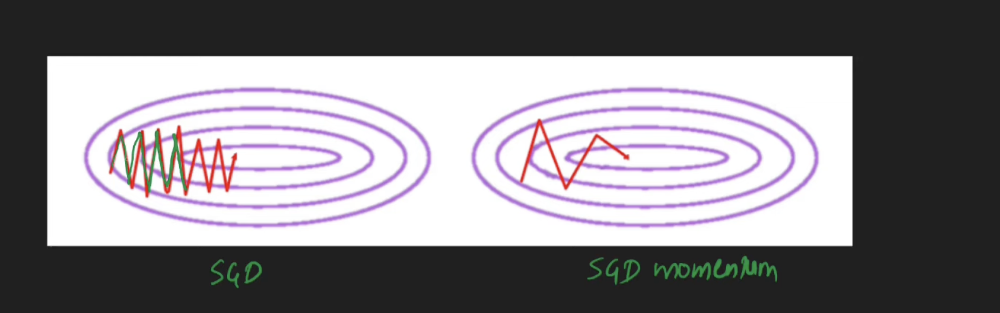
The transcript explains this through a specific scenario: a loss surface that is shaped like a **steep ravine** – very steep in the vertical direction but gradually sloping in the horizontal direction.

| Without Momentum (Vanilla SGD) | With Momentum |
| :--- | :--- |
| The optimizer takes many small, zig-zagging steps. | The optimizer builds velocity in the horizontal direction. |
| It oscillates heavily in the steep (vertical) direction. | Oscillations in the vertical direction are smoothed out. |
| Convergence is slow because it keeps bouncing back and forth. | Movement in the horizontal direction accelerates. |
| The path to the minimum is long and inefficient. | The path is more direct and much faster. |

> **Visualization from the transcript:** Imagine a long, narrow valley that slopes gently downward. Vanilla SGD zig-zags wildly from one wall to the other as it tries to go down. Momentum, however, builds speed along the length of the valley and reaches the bottom much sooner.

#### The Biggest Disadvantage: Overshooting the Optimum
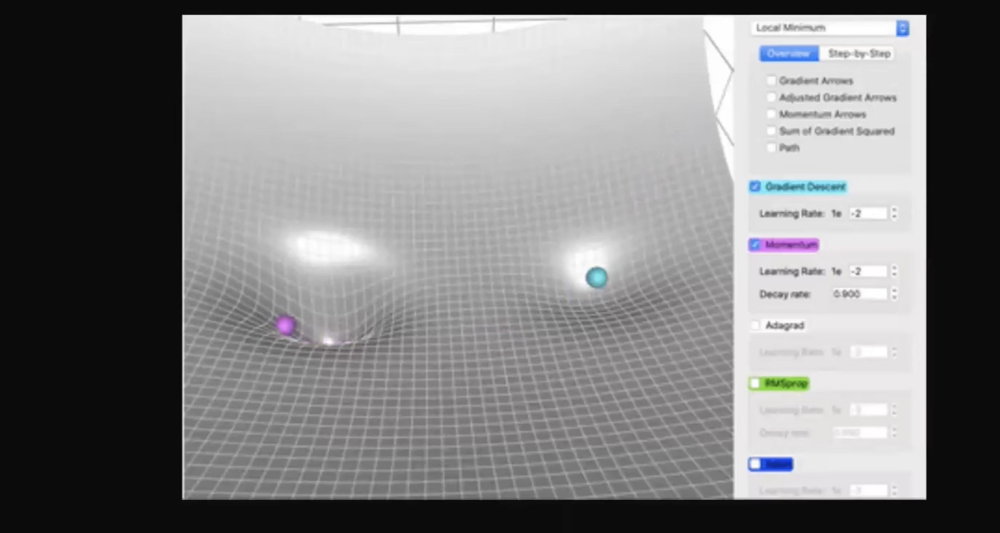
Because Momentum has "mass" and maintains velocity, it can sometimes **overshoot** the optimal solution. Instead of stopping exactly at the minimum, it flies past it.

**How overshooting happens:**

1. The optimizer approaches the minimum (lowest point) with high velocity.
2. It "misses" the exact stopping point and continues moving past it.
3. It may go up the other side of the valley.
4. It then has to turn around and come back.
5. This back-and-forth motion wastes time.

> **Analogy:** Imagine driving a heavy truck toward a parking spot. If you come in too fast, you can't stop exactly in the spot – you overshoot, have to reverse, adjust, and try again. A light bicycle (vanilla SGD) can stop much more precisely.

#### Visual Evidence from the Transcript

The transcript describes two key visualizations showing this disadvantage:

**Example 1 – Entering a large pit (global minimum):**
- The purple line (Momentum) approaches the pit with high speed.
- It doesn't stop immediately at the bottom.
- It continues moving, going up the other side slightly.
- It oscillates (bounces) a few times before finally settling down.
- This "settling time" is wasted – vanilla SGD would have stopped directly at the bottom (though it might not have reached the pit at all).

**Example 2 – 3D surface with a single pit (minimum):**
- Momentum comes in very fast.
- It overshoots the minimum, goes up and down the other side.
- It may cross over, come back, cross again.
- This "taking all situations" behavior wastes a lot of time.
- The transcript notes that **fastest convergence** is not always achieved because of this overshooting behavior.

#### Why Does Overshooting Occur?

The root cause is the **velocity memory**. Even after passing the minimum point, the optimizer still has accumulated velocity from previous steps. It takes time for the velocity to "drain away" (decay), especially when β is high (close to 0.99).

The transcript explains that with β = 0.9 (a common value), old velocities **gradually** start being forgotten. But the optimizer doesn't stop instantly – it needs time to slow down.

#### Trade-off Summary

| Aspect | Vanilla SGD | SGD with Momentum |
| :--- | :--- | :--- |
| **Speed on flat/gentle slopes** | Slow | Fast |
| **Ability to escape local minima** | Poor | Good |
| **Precision at the minimum** | High (stops directly) | Lower (may overshoot and oscillate) |
| **Handling of saddle points** | Poor (gets stuck) | Good |
| **Risk of wasted time** | Low (just slow) | Medium (overshooting + settling time) |

> **Key insight:** Momentum is generally **much faster overall** despite the overshooting behavior. The speed gained during most of the journey outweighs the small settling time at the end.

### 3. Key Points

- **Biggest advantage:** Speed – Momentum trains much faster than vanilla SGD.
- **Speed comes from:** Building velocity in consistent directions and smoothing out oscillations (especially in steep ravines).
- **Biggest disadvantage:** Overshooting the optimum – the optimizer may fly past the minimum and waste time oscillating before settling.
- **Overshooting happens because:** Velocity doesn't disappear instantly; it takes time to decay, especially with high β values.
- **Despite overshooting,** Momentum is still significantly faster than vanilla SGD overall.
- The transcript states: "The single most important benefit of using Momentum optimization is speed – 99% of the time."

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Expecting Momentum to stop exactly at the minimum. | Momentum has inertia; it will naturally overshoot and oscillate. | Accept some settling time; consider reducing β if overshooting is severe. |
| Thinking overshooting means Momentum is worse than vanilla SGD. | Overshooting is a small cost compared to the massive speed gains elsewhere. | Compare total training time, not just final precision. |
| Using Momentum when precision is critical and the loss surface is very flat near the minimum. | Overshooting can cause many wasted iterations at the end. | Try reducing β (e.g., from 0.9 to 0.5) or switching to another optimizer (like Adam) for the final fine-tuning. |
| Ignoring the "settling time" when evaluating Momentum. | You might mistakenly think Momentum is slower because of the final oscillations. | Visualize the full training curve – Momentum usually reaches a low loss much earlier despite overshooting. |

### 5. Interview / Exam Questions

**Q1: What is the single most important benefit of using Momentum optimization, according to the transcript?**  
**A:** Speed – Momentum converges much faster than normal stochastic gradient descent in 99% of cases.

**Q2: How does Momentum achieve faster training on a loss surface with high curvature (a steep ravine)?**  
**A:** Momentum builds velocity in the horizontal (slow) direction while smoothing out oscillations in the vertical (steep) direction, allowing a much more direct and faster path to the minimum.

**Q3: What is the biggest disadvantage of Momentum?**  
**A:** Overshooting the optimum – because of its accumulated velocity, Momentum may fly past the minimum and waste time oscillating before settling down.

**Q4: Why does overshooting occur in Momentum?**  
**A:** The velocity term retains memory of past gradients. Even after passing the minimum, the optimizer still has momentum that takes time to decay (especially with high β values like 0.9 or 0.99).

**Q5: Despite overshooting, why is Momentum still considered better than vanilla SGD overall?**  
**A:** The speed gained during most of the training journey (especially through flat regions, saddle points, and steep ravines) far outweighs the small amount of time wasted in final settling oscillations.

**Q6: How can you reduce overshooting in Momentum?**  
**A:** Use a lower β value (e.g., 0.5 instead of 0.9), which reduces the memory of past velocities and allows the optimizer to slow down more quickly near the minimum.

### 6. Revision Notes

- **Advantage summary:**
  - ✅ **Fast** – builds speed in consistent directions
  - ✅ Smooths oscillations in steep/curved areas
  - ✅ Faster than vanilla SGD in 99% of cases

- **Disadvantage summary:**
  - ❌ **Overshoots** – flies past the minimum
  - ❌ **Settling time** – oscillates before stopping
  - ❌ Wastes some time at the very end

- **Trade-off:** Speed during journey vs. precision at destination
- **Net result:** Momentum is a clear winner for most deep learning tasks
- **Visualization from transcript:** Purple line (Momentum) reaches the bottom faster but bounces; blue line (vanilla SGD) is slower but stops directly

---


## Topic 5: Recommended Beta Values and Practical Tuning

### 1. Introduction

The beta (β) hyperparameter controls how much "memory" the Momentum optimizer has. Choosing the right β value is critical for getting good results. The transcript provides specific recommendations for β values, explains what happens at extreme values, and gives practical guidance for tuning.

### 2. Detailed Explanation

#### What Beta Controls

Beta determines the **decay rate** of past velocities:
- High β = long memory (relies heavily on past gradients)
- Low β = short memory (relies more on the current gradient)

Mathematically, β is the multiplier applied to the previous velocity \( v_{t-1} \). A β of 0.9 means that 90% of the previous velocity is retained, and only 10% comes from the new gradient.

#### Recommended Beta Values

The transcript gives specific recommendations:

| Beta Value | When to Use | Effect |
| :--- | :--- | :--- |
| **β = 0.9** | **Default / most common** | Strong momentum, good balance of speed and stability. Works well for most problems. |
| **β = 0.99** | When you have very consistent gradient directions | Very strong memory; use with caution. Can cause significant overshooting. |
| **β = 0.5** | When gradients change direction frequently | Moderate momentum; less overshooting, but also less speed benefit. |
| **β = 0** | Never for Momentum (use vanilla SGD instead) | No momentum effect at all. |
| **β = 1.0** | **Never** | Velocities never decay; optimizer may never converge properly. |

> **Important quote from transcript:** "Generally, point nine, point nine, or then point five, that's all the information you need."

#### What Happens at the Extremes?

**If β = 0:**
- Formula becomes: \( v_t = 0 \times v_{t-1} + \eta \times \nabla L = \eta \times \nabla L \)
- Weight update: \( W_{new} = W_{current} - \eta \times \nabla L \)
- This is **exactly vanilla SGD** – no momentum benefit
- The transcript says: "If the son's value becomes zero, it will go to top ten and become poetic" – meaning it reverts to basic SGD

**If β = 1.0:**
- Formula becomes: \( v_t = 1 \times v_{t-1} + \eta \times \nabla L \)
- Velocities **never decay** – they accumulate forever
- The optimizer acts like a ball that "will keep roaming like this"
- It reaches a "scientific dynamic equilibrium" but never properly settles
- The transcript warns: "Don't do forests because of binod mode" (don't set β near 1)

#### Why β = 0.9 is the Default Choice

The transcript explains that β = 0.9 provides:
- **Strong momentum** – good speed benefits
- **Gradual forgetting** – older velocities decay exponentially but still contribute
- **Stable convergence** – doesn't overshoot excessively
- **Effective window** of about 10 past gradients \( (1/(1-0.9) = 10) \)

#### Practical Tuning Advice

| Scenario | Recommended β | Reasoning |
| :--- | :--- | :--- |
| Starting point / unknown problem | **0.9** | Safe default that works for most cases |
| Very noisy gradients | **0.99** | Need longer memory to smooth out noise |
| Highly oscillatory loss surface | **0.99** | Stronger smoothing effect |
| Need precise final convergence | **0.5** | Less overshooting at the end |
| Gradients change direction frequently | **0.5 or lower** | Faster adaptation to new directions |
| Using very large learning rate | **Higher β (0.95-0.99)** | Helps stabilize updates |

#### The Effective Window Size

The transcript provides this useful formula:

\[
\text{Effective window} \approx \frac{1}{1 - \beta}
\]

Examples:
- β = 0.5 → window ≈ 2 past gradients
- β = 0.9 → window ≈ 10 past gradients  
- β = 0.99 → window ≈ 100 past gradients

This tells you approximately how many previous updates meaningfully contribute to the current velocity.

### 3. Key Points

- **β = 0.9** is the recommended default value for most problems.
- **β = 0.99** is for very consistent gradients or noisy surfaces (stronger memory).
- **β = 0.5** is for when you need less overshooting or gradients change frequently.
- **β = 0** disables momentum entirely (becomes vanilla SGD).
- **β = 1.0** is dangerous – velocities never decay and the optimizer may never converge.
- The effective memory window ≈ \( 1/(1-\beta) \).
- Start with β = 0.9, then tune up or down based on behavior.

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Using β = 0.99 for every problem | Very high β causes significant overshooting and wasted settling time. | Start with 0.9; only increase to 0.99 if you have a specific reason (e.g., very noisy gradients). |
| Setting β = 0 thinking you're using Momentum | β = 0 completely disables momentum – you're just using vanilla SGD. | Always verify β > 0 if you want momentum benefits. |
| Setting β = 1.0 | Velocities never decay; the optimizer may oscillate forever without converging. | Never set β exactly to 1.0. |
| Changing β without changing learning rate | β and learning rate interact; a change in one may require adjusting the other. | When you change β, experiment with learning rate as well. |
| Ignoring the effective window size | Different β values mean different amounts of "memory" – this affects behavior significantly. | Calculate \( \frac{1}{1-\beta} \) to understand how many past gradients matter. |

### 5. Interview / Exam Questions

**Q1: What is the default recommended value for β in Momentum optimization?**  
**A:** β = 0.9 is the most common and recommended default value.

**Q2: What happens when β = 0 in the Momentum formula?**  
**A:** The velocity becomes just the current gradient scaled by learning rate, and the weight update becomes identical to vanilla gradient descent. Momentum is completely disabled.

**Q3: Why should β never be set to 1.0?**  
**A:** With β = 1.0, past velocities never decay. The optimizer accumulates all past gradients forever, causing it to keep moving indefinitely without properly converging to the minimum.

**Q4: Approximately how many past gradients contribute to the current velocity when β = 0.9?**  
**A:** Approximately

$$
\frac{1}{1-0.9} = 10
$$

past gradients.

**Q5: When might you use β = 0.99 instead of 0.9?**  
**A:** When gradients are very noisy or the loss surface is highly oscillatory – the stronger memory helps smooth out fluctuations and provides more stable updates.

**Q6: When might you use β = 0.5 instead of 0.9?**  
**A:** When you need less overshooting (more precise final convergence) or when gradients change direction frequently and you want the optimizer to adapt more quickly.

### 6. Revision Notes

- **Default β = 0.9** (works for most problems)
- **β range:** Typically 0.5 to 0.99
- **β = 0** → vanilla SGD (no momentum)
- **β = 1.0** → dangerous, never use
- **Higher β** = longer memory, stronger smoothing, more overshooting
- **Lower β** = shorter memory, faster adaptation, less overshooting
- **Effective memory window** ≈ \( 1/(1-\beta) \)
- **Tuning strategy:** Start at 0.9 → if overshooting is severe, try 0.5 → if gradients are very noisy, try 0.99

---



## Topic 6: Visualizing Momentum in Action (Web Demo and 3D Surfaces)

### 1. Introduction

The transcript emphasizes that Momentum is best understood through **visualization** – watching how the optimizer moves across different loss surfaces. The creator spent significant effort adding animations and mentions a **web-based interactive demo** where you can click on different points of a loss surface and see how Momentum behaves compared to vanilla SGD.

Visualizations help develop **intuition** – which the transcript calls the most important part of understanding optimization algorithms.

### 2. Detailed Explanation

#### Types of Graphs Used in the Transcript

The transcript describes three different types of graphs used throughout the video:

| Graph Type | What It Shows | When Used |
| :--- | :--- | :--- |
| **2D plot (curve)** | Loss vs. a single parameter (W) | When the network has only one weight – simple to understand |
| **3D surface plot** | Loss vs. two parameters (W and b) | When the network has two weights – shows hills, valleys, and pits |
| **Contour plot / Projection** | A "top-down" view of the 3D surface | Looking down from above; lines connect points of equal loss (like a topographic map) |

#### Understanding the 3D to 2D Projection

The transcript explains a key concept: when you have a 3D loss surface (two parameters), you can look at it from **different angles**:
- **Side view** – shows height (loss value)
- **Top-down projection (contour plot)** – shows loss values using **colors**

> **Color mapping in contour plots:**
> - **Yellow / Orange** = high loss (high altitude, bad predictions)
> - **Purple / Blue** = low loss (low altitude, good predictions)
> - The transcript mentions: "This color is telling you that height is the third dimension"

#### Example 3D Surfaces Shown in the Transcript

The transcript describes several 3D surface shapes to help build intuition:

**Shape 1: A bowl with a hole in the middle**
- A surface that curves down from the edges
- Has a hole/pit at the center (lowest point)
- Blue/purple colors represent the low-altitude hole
- This is a convex-like shape

**Shape 2: A saddle point surface**
- Rises on two opposite sides (orange/yellow – high)
- Sinks on the other two sides (blue – low)
- The middle point is the saddle – flat in one direction, sloped in another

**Shape 3: A slanted sheet (ramp)**
- High on one side (yellow)
- Low on the opposite side (blue)
- Gradually slopes down – like a tilted piece of paper

**Shape 4: A surface with two pits (local and global minimum)**
- One small pit (local minimum) – represented by a smaller crater
- One large pit (global minimum) – represented by a larger crater
- This is used to demonstrate Momentum escaping local minima

**Shape 5: X² - y² (a pure saddle point surface)**
- The transcript mentions this mathematical function
- Blue represents minimum points
- Orange/yellow represents maximum points
- The middle is the saddle point where all contour lines meet

#### The Web-Based Interactive Demo

The transcript describes a **very important visualization tool**:

> "I will share the code of this thing... very satisfying seeing the entire algorithm in action... play with it a little, very funny and a little bit of intuition best."

**What the demo shows:**
- A loss surface plot (likely 2D contour or 3D)
- A global minimum pit and a local minimum pit (comparatively sized)
- You can **click any point** on the surface
- The demo then shows how different optimizers traverse from that starting point

**Colors in the demo:**
- **Blue line** = SGD with Momentum
- **Black line** = Vanilla SGD (normal gradient descent)

**Key observation from the demo (as described in the transcript):**
> "Momentum before reaching local minimum will flat and then gently dilute its velocity then go and stop"

This refers to the overshooting behavior: Momentum approaches the minimum, overshoots slightly, then gradually slows down and settles.

**What you can observe by clicking different points:**
- Starting from different locations changes how much overshooting occurs
- The black line (vanilla SGD) moves slowly and gets stuck more easily
- The blue line (Momentum) moves faster but may bounce past minima

### 3. Key Points

- **Visualization is critical** for understanding optimization algorithms – more important than memorizing formulas.
- **Three graph types:** 2D curves, 3D surfaces, and contour projections (top-down with color).
- **Contour plots use color** to represent loss: yellow/orange = high loss, purple/blue = low loss.
- **The web demo** lets you click any point on a loss surface to compare Momentum (blue) vs. vanilla SGD (black).
- **Momentum behavior visible in the demo:**
  - Faster movement overall
  - Overshoots and then gently slows down
  - Can escape local minima that trap vanilla SGD
- The transcript creator promises to **share the code** for this visualization.

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Trying to understand Momentum only through formulas | Mathematical formulas don't show the dynamic overshooting, acceleration, and settling behaviors. | Always visualize or simulate the optimizer's path on different surfaces. |
| Ignoring contour plots | 3D surfaces can be hard to read; contour plots with color are often clearer for comparing optimizer paths. | Learn to read both 3D surface plots and 2D contour projections. |
| Thinking one visualization represents all cases | The optimizer's behavior changes dramatically depending on starting point and surface shape. | Use interactive demos to explore many starting points. |
| Forgetting that humans can't visualize >3 dimensions | Real neural networks have millions of parameters – we can't plot that. Visualizations are simplified for intuition. | Accept that visualizations are metaphors; real high-dimensional behavior may differ. |

### 5. Interview / Exam Questions

**Q1: What are the three types of graphs mentioned in the transcript for visualizing optimization?**  
**A:** (1) 2D plots (loss vs. single parameter), (2) 3D surface plots (loss vs. two parameters), (3) Contour plots / projections (top-down view with color representing loss height).

**Q2: In the contour plots described, what do yellow/orange colors typically represent?**  
**A:** High loss values (high altitude, worse predictions).

**Q3: What colors represent low loss (good predictions) in the transcript's contour plots?**  
**A:** Purple and blue represent low altitude / low loss.

**Q4: In the web-based demo mentioned, what do the blue line and black line represent?**  
**A:** Blue line = SGD with Momentum. Black line = Vanilla SGD.

**Q5: What behavior of Momentum can you observe in the web demo when it approaches a local minimum?**  
**A:** It flattens out (slows down), gently dilutes its velocity, then goes and stops – showing the overshoot and settle pattern.

**Q6: Why is visualization particularly important for understanding Momentum?**  
**A:** Because the dynamic behavior (acceleration, overshooting, settling, escaping pits) is not obvious from the mathematical formulas alone. Watching the optimizer move builds intuition.

### 6. Revision Notes

- **Visualization builds intuition** – more important than memorizing formulas
- **Graph types:**
  - 2D curve (1 parameter)
  - 3D surface (2 parameters)
  - Contour plot (top-down, color-coded)

- **Color meaning:**
  - Yellow/Orange = high loss 🔴 (bad)
  - Purple/Blue = low loss 🟢 (good)

- **Example surfaces shown:**
  - Bowl with hole (convex-like)
  - Saddle point (up two sides, down two sides)
  - Slanted sheet (ramp)
  - Two pits (local + global minimum)
  - X² - y² (pure saddle)

- **Interactive demo:**
  - Click any starting point
  - Blue = Momentum, Black = vanilla SGD
  - Observe speed, overshooting, and pit escape

- **Code will be shared** – you can run the visualization yourself

---



## Topic 7: Summary Comparison – Momentum vs. Vanilla SGD

### 1. Introduction

This final topic brings together everything we've learned into a direct, side-by-side comparison between **vanilla Stochastic Gradient Descent (SGD)** and **SGD with Momentum**. Understanding the trade-offs between these two optimizers will help you decide which one to use and when.

### 2. Detailed Explanation

#### Side-by-Side Comparison Table

Based entirely on the transcript, here is how the two optimizers compare across key dimensions:

| Aspect | Vanilla SGD | SGD with Momentum |
| :--- | :--- | :--- |
| **Memory** | No memory – each step depends only on current gradient | Has memory – velocity accumulates past gradients |
| **Speed** | Slow on flat regions and gentle slopes | **Fast** – builds speed in consistent directions |
| **Handling of saddle points** | Gets stuck – moves very slowly or stops | Maintains velocity and moves through |
| **Handling of local minima** | Gets trapped in small pits | Can roll out of small local minima |
| **Handling of high curvature** | Oscillates heavily (zig-zag behavior) | Smooths oscillations, moves more directly |
| **Precision at minimum** | High – stops directly at the minimum | Lower – overshoots and oscillates before settling |
| **Path to minimum** | Winding, inefficient | More direct, smoother |
| **Risk of wasted time** | Low (just consistently slow) | Medium (overshooting and settling time) |
| **Overall training time** | Slow | **Much faster** (despite overshooting) |

#### Visual Comparison from the Transcript

**Comparison 1: On a convex (bowl-shaped) surface**
- Vanilla SGD: Smooth, direct path to the minimum (works well)
- Momentum: Also reaches minimum, but may overshoot slightly

**Comparison 2: On a surface with two pits (local + global minimum)**
- Vanilla SGD (blue line): Gets stuck in the small pit (local minimum) – never reaches global minimum
- Momentum (purple line): Rolls into small pit, but has enough speed to escape and continue to the larger global minimum

**Comparison 3: On a surface with a ravine (high curvature)**
- Vanilla SGD: Takes many small zig-zag steps, oscillating between steep walls
- Momentum: Builds velocity along the valley floor, smoothing oscillations and reaching the bottom faster

**Comparison 4: On a surface with a saddle point**
- Vanilla SGD: Gets stuck or moves extremely slowly
- Momentum: Maintains velocity and crosses the flat region without stopping

#### The Key Takeaway

The transcript is very clear: **Momentum is superior to vanilla SGD in almost every practical scenario** for deep learning. The only real drawbacks are:
1. Slight overshooting and settling time at the end
2. Potential to overshoot so much that it wastes time (though still faster overall)

> **Quote from transcript:** "Momentum is faster than normal stochastic gradient descent in 99% of cases."

#### When Might You Still Use Vanilla SGD?

Based on the transcript's information, vanilla SGD might be preferred only in very specific situations:
- When you need **extremely precise** final convergence and cannot tolerate any overshooting
- When the loss surface is already **convex** (simple bowl shape) – though even then, Momentum is not harmful
- When you are doing a **very simple** problem where speed doesn't matter

However, the transcript emphasizes that for **real deep learning** with complex neural networks, Momentum is strongly recommended.

### 3. Key Points

- **Vanilla SGD** = weight update based only on current gradient: \( W_{new} = W - \eta \nabla L \)
- **Momentum** = adds velocity with memory: \( v = \beta v + \eta \nabla L \), then \( W_{new} = W - v \)
- **Momentum advantages:** Speed, escapes local minima, handles saddle points, smooths oscillations
- **Momentum disadvantages:** Overshooting, settling time
- **Net result:** Momentum is significantly faster overall and finds better solutions
- **The transcript's verdict:** Use Momentum – it's better in 99% of cases

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
| :--- | :--- | :--- |
| Starting with vanilla SGD for a new deep learning problem | You will waste time on slow convergence and may get stuck in poor local minima. | Start with Momentum (β = 0.9) as your default optimizer. |
| Switching to vanilla SGD because Momentum overshoots | The overshooting is usually a small cost compared to the speed gains elsewhere. | Compare total iterations to reach target loss, not just final behavior. |
| Thinking vanilla SGD is "simpler so it's better" | Simpler doesn't mean better for complex problems. Momentum adds minimal complexity for huge gains. | Evaluate based on empirical results, not theoretical simplicity. |
| Using both optimizers the same way | They require different hyperparameter tuning (learning rate, β). | Tune learning rate separately for each optimizer. |

### 5. Interview / Exam Questions

**Q1: What is the main difference between vanilla SGD and SGD with Momentum?**  
**A:** Vanilla SGD updates weights using only the current gradient. Momentum maintains a velocity variable that accumulates past gradients, then updates weights using that velocity instead of the raw gradient.

**Q2: On which type of loss surface does vanilla SGD perform poorly while Momentum performs well?**  
**A:** Saddle points (flat regions), surfaces with high curvature (steep ravines), and surfaces with small local minima.

**Q3: What is one scenario where vanilla SGD might be preferred over Momentum?**  
**A:** When extremely precise convergence is needed and overshooting cannot be tolerated, or on very simple convex problems where Momentum's advantages are unnecessary.

**Q4: According to the transcript, what percentage of cases is Momentum faster than vanilla SGD?**  
**A:** 99% of cases.

**Q5: How does the path to the minimum differ between vanilla SGD and Momentum on a high-curvature surface?**  
**A:** Vanilla SGD zig-zags heavily, oscillating between steep walls. Momentum builds velocity along the valley floor, creating a smoother, more direct path.

**Q6: Why can Momentum escape local minima while vanilla SGD cannot?**  
**A:** Momentum has accumulated velocity from past updates. When it encounters a small pit, this velocity carries it through and out the other side. Vanilla SGD has no velocity and simply stops at the lowest point of the pit.

### 6. Revision Notes

| Feature | Vanilla SGD | Momentum |
| :--- | :--- | :--- |
| Formula | \( W = W - \eta \nabla L \) | \( v = \beta v + \eta \nabla L \), \( W = W - v \) |
| Memory | None | Yes (velocity) |
| Speed | Slow | Fast |
| Local minima | Gets stuck | Escapes |
| Saddle points | Stuck/slow | Moves through |
| High curvature | Oscillates | Smooths |
| Precision | High (stops exactly) | Lower (overshoots) |
| **Verdict** | For simple problems only | **Default for deep learning** |

**Final recommendation from the transcript:** Use SGD with Momentum with β = 0.9 as your starting point for most deep learning tasks.

---

**This concludes all topics from the transcript.** You have covered:
1. Why we need optimization techniques (non-convex problems)
2. What Momentum is and why to use it
3. The mathematics (formulas and β parameter)
4. The biggest advantage (speed) and disadvantage (overshooting)
5. Recommended β values and tuning
6. Visualizations and the web demo
7. Final comparison: Momentum vs. vanilla SGD